# Assignment 2 - INFO 290T - Biosensory Computing
### Author: Erin Jones
### Deadline: 9/28

### Question 0 - 

I am comfortable with any part of my code being shared with the class

### Question 1

In [1]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
import numpy as np
import scipy.io

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

plt.rcParams['figure.figsize'] = [30, 10]  # Bigger images
plt.rcParams['font.size']= 14
from dataset_download import fixmat

In [2]:
data, meta = fixmat.load('./dataset_download/etdb_v1.0.hdf5', 'Baseline')
meta

{'# Fix.': 203772,
 '# Obs.': 48,
 'Age': '23.1 (19-28)',
 'Article': 15.0,
 'Categories': '7,8,10,11',
 'Disp. Size (degree)': '29x22',
 'Display': 'SM1100',
 'Display resolution (pixels)': '1280x960',
 'Eye Tracker': 'EL II',
 'ID': 3,
 'Img. Pos. (pixel)': '0,0',
 'Img. size (pixel)': '1280x960',
 'PPD': 45.6,
 'Sampling freq. (Hz)': '500 Hz',
 'Task': 'FV',
 'V. Dur.': '6s',
 'V. dist. (cm) ': 80,
 'Val. error (degrees)': 0.3}

#### Q1A - Plots

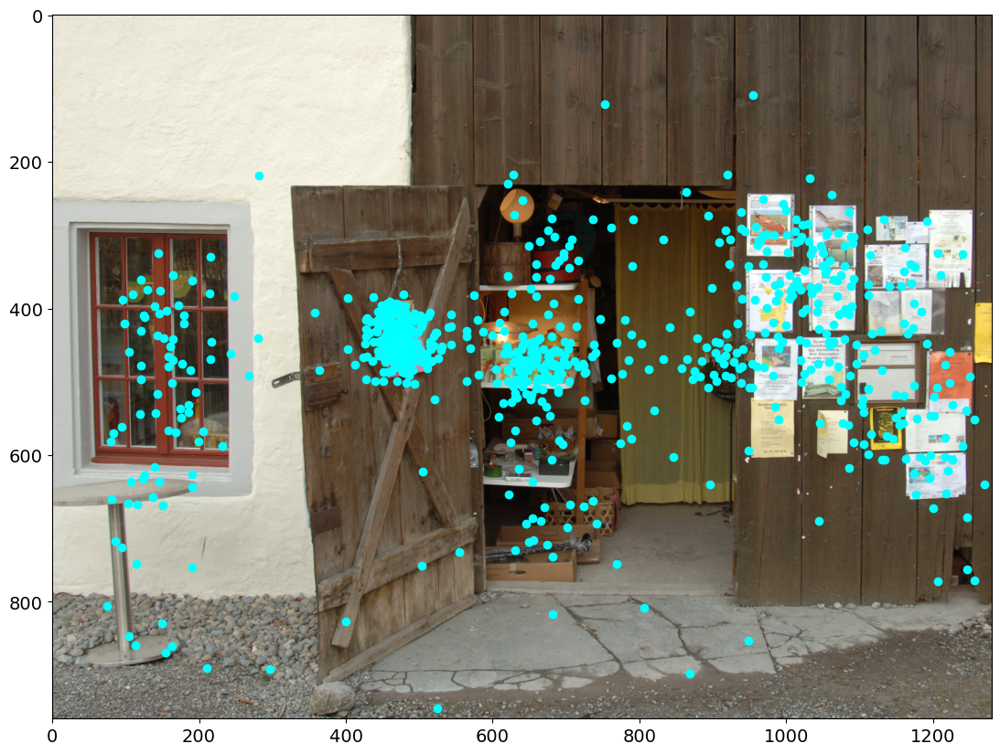

In [3]:
data_fixations =data.loc[(data['category'] == 8.0) & (data['filenumber'] == 64.0)]
# might be interesting to go in and modify colors at a future point
x_all = np.asarray(data_fixations['x'])
y_all = np.asarray(data_fixations['y'])

img = plt.imread("./dataset_download/8/64.png")
plt.imshow(img, zorder=0)
# aqua because red is boring
plt.scatter(x_all,y_all,s=36,zorder=2,color='aqua')
plt.show()
# data.loc[(data['category'] == 8.0) & (data['filenumber'] == 64.0) & (data['SUBJECTINDEX'] == 3.0)]

#### Q1A - Written Response

Based on visual inspection of the above scatter plot, the sign on the door seemed to receive the greatest number of fixations

#### Q1B - Plots

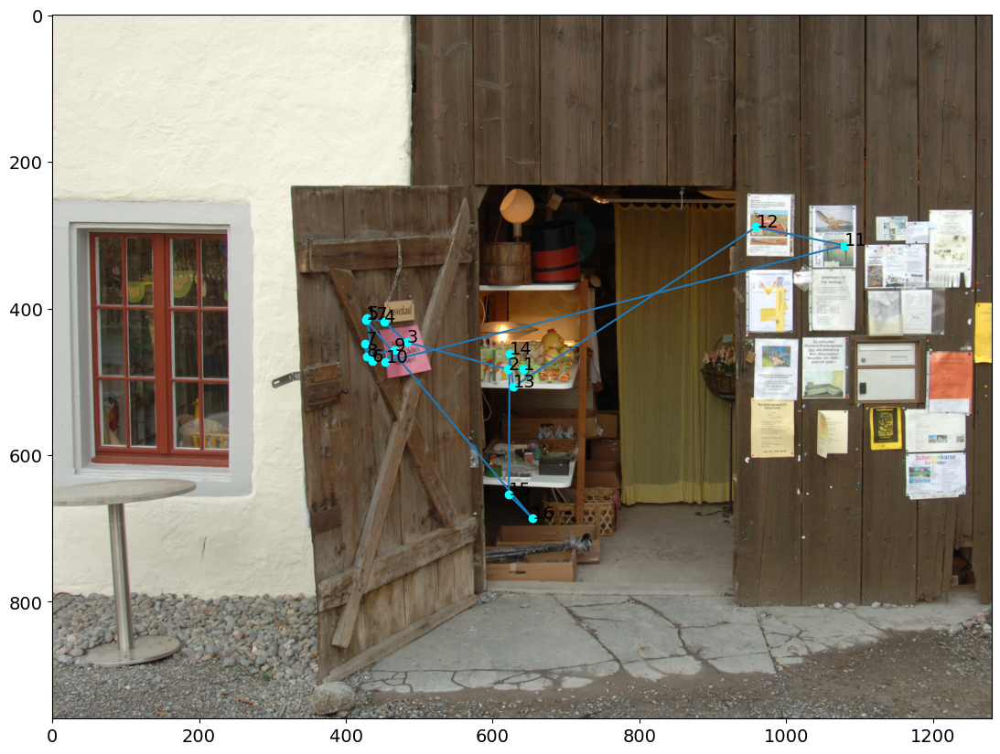

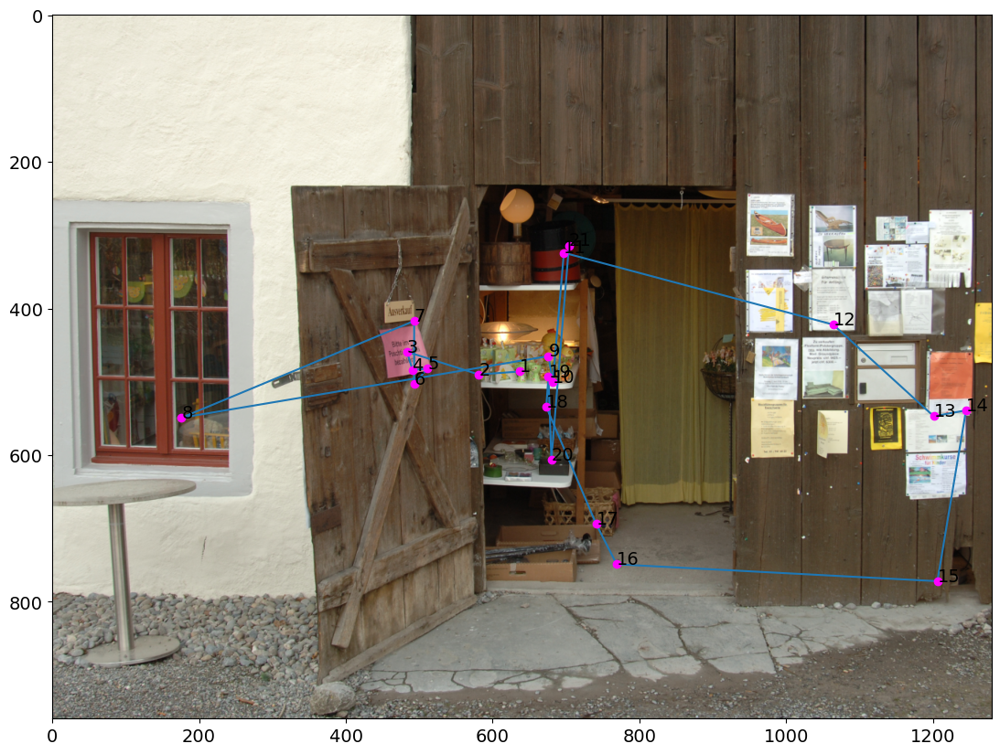

In [4]:
# Scanpath for Observer 1
o1_fixations = data_fixations[data_fixations['SUBJECTINDEX'] == 1.0]
o1_fixations

x1 = np.asarray(o1_fixations['x'])
y1 = np.asarray(o1_fixations['y'])
d1 = np.asarray(o1_fixations['end']) - np.asarray(o1_fixations['start'])

plt.imshow(img, zorder=0)
plt.plot(x1,y1,zorder=1)
plt.scatter(x1,y1,s=36,zorder=2,color='aqua')
for i in range(len(d1)):
    plt.annotate(str(i+1), (x1[i], y1[i]), color='black')
plt.show()

# Scanpath for Observer 2
o2_fixations = data_fixations[data_fixations['SUBJECTINDEX'] == 2.0]
o2_fixations

x2 = np.asarray(o2_fixations['x'])
y2 = np.asarray(o2_fixations['y'])
d2 = np.asarray(o2_fixations['end']) - np.asarray(o2_fixations['start'])

plt.imshow(img, zorder=0)
plt.plot(x2,y2,zorder=1)
plt.scatter(x2,y2,s=36,zorder=2,color='magenta')
for i in range(len(d2)):
    plt.annotate(str(i+1), (x2[i], y2[i]), color='black')
plt.show()

#### Q1B - Written

Observer 1 starts by spending a lot of time (~10 fixations) looking at the sign (maybe trying to read it?). Observer 1 appears to be less 'fixated' on the sign on the door, instead starting by scanning the middle shelf in the first two fixations, then spending a handful of fixations looking at the sign on the door, then glancing over to the window on the left and then returning to the sign and then back to the shelving. Oberserver 1 instead jumps over to the posters on the far right wall, specifically those with photos, before returning to examine the middle and bottom shelves. Observer 1 looks for at least 2 fixations at the dark space under the shelf, with which observer 2 does not concern themselves. Observer 2 also moves from shelves to the posters on the right hand side but looks at a different grouping of posters (not the ones with pictures) and then jumps to check out the hole in the wood on the bottom right side of the poster wall, before returning to the shelves.

Overall, observer 1 and 2 had similar interest in checking out all of the posted signage and looking at the shelves. Observer 1 fixated on a much smaller area, not checking out the window to the left or the hole in the bottom right at all.

#### Q1C - Plots

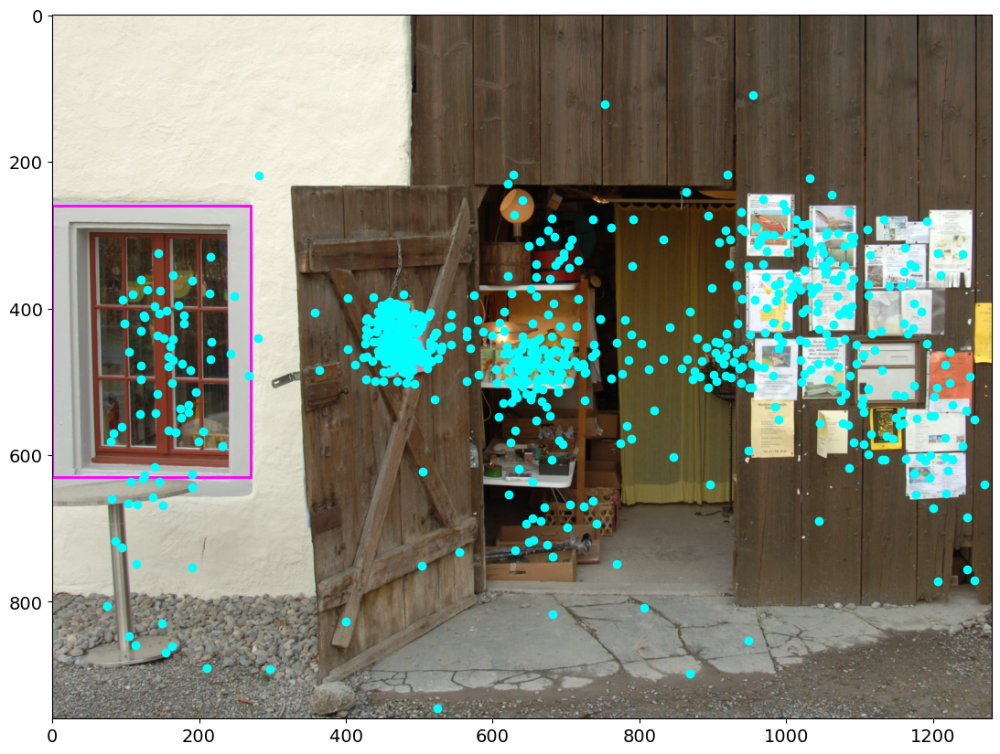

In [5]:
plt.imshow(img, zorder=0)
plt.gca().add_patch(patches.Rectangle((0,260),270,370,linewidth=2, edgecolor='magenta', facecolor='none'))
plt.scatter(x_all,y_all,s=36,zorder=2,color='aqua')
plt.show()

#### Q1C - Written

In [6]:
rect_x = 0
rect_y = 260
rect_width = 270
rect_height = 370

points_inside = sum((rect_x <= x_all) & (x_all <= rect_x + rect_width) & (rect_y <= y_all) & (y_all <= rect_y + rect_height))
probability = points_inside/len(data_fixations)
print(f"There are {points_inside} total fixations over the course of the dataset inside the box, so the probability that a fixation will occur inside the box is {probability}")

subject_ids = data_fixations['SUBJECTINDEX'].unique()

n_subjects = 0
for index in subject_ids:
    sample = data_fixations[data_fixations['SUBJECTINDEX'] == index]
    s_x = sample['x']
    s_y = sample['y']
    inside = (rect_x <= s_x) & (s_y <= rect_x + rect_width) & (rect_y <= s_y) & (s_y <= rect_y + rect_height)
    if (any(item is True for item in inside)):
        n_subjects += 1

p = n_subjects/len(subject_ids)

print(f"However, in reality, this is vastly inflated by only {n_subjects} looking within the rectangle many times. The probability instead that a subject will look in the defined patch (i.e. at the window) is actually {p}")

There are 57 total fixations over the course of the dataset inside the box, so the probability that a fixation will occur inside the box is 0.07317073170731707
However, in reality, this is vastly inflated by only 2 looking within the rectangle many times. The probability instead that a subject will look in the defined patch (i.e. at the window) is actually 0.041666666666666664


#### Q1D - Plots

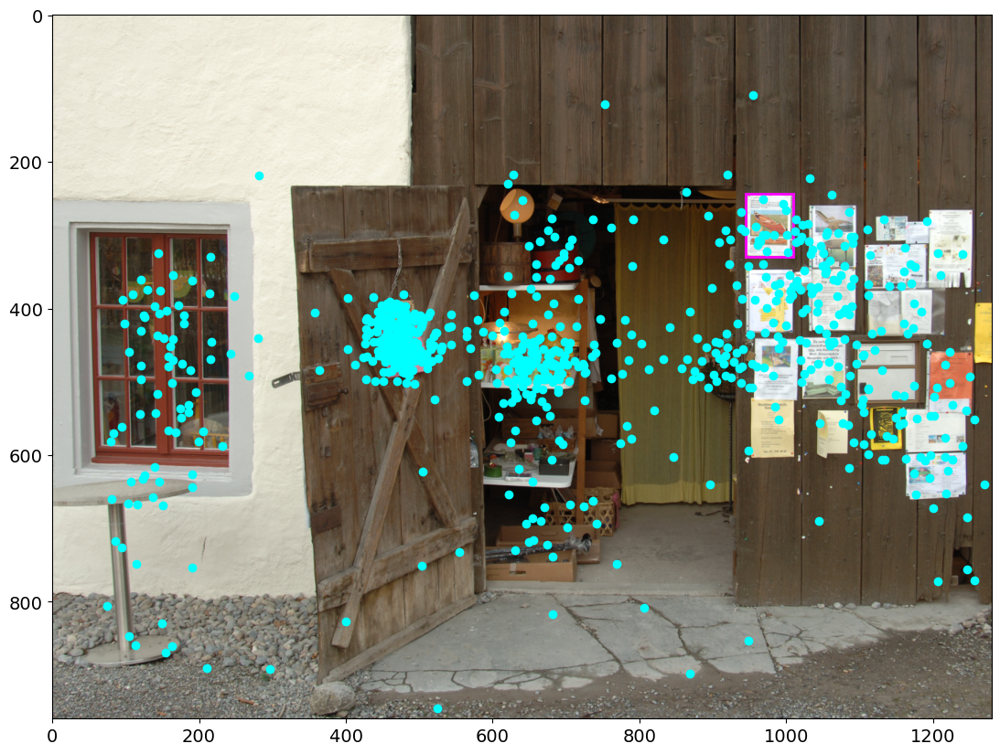

In [7]:
rect_x = 945
rect_y = 244
rect_width = 65
rect_height = 85

plt.imshow(img, zorder=0)
plt.gca().add_patch(patches.Rectangle((rect_x,rect_y),rect_width,rect_height,linewidth=2, edgecolor='magenta', facecolor='none'))
plt.scatter(x_all,y_all,s=36,zorder=2,color='aqua')
plt.show()


#### Q1D - Written

In [8]:
subject_ids = data_fixations['SUBJECTINDEX'].unique()
df = data_fixations.copy()
df['duration'] = df['end'] - df['start']

subject_duration = {}

for index in subject_ids:
    sample = (df[df['SUBJECTINDEX'] == index]).copy()
    s_x = sample['x']
    s_y = sample['y']
    inside = (rect_x <= s_x) & (s_y <= rect_x + rect_width) & (rect_y <= s_y) & (s_y <= rect_y + rect_height)
    sample['inside'] = inside
    s_duration = 0
    if (any(item is True for item in inside)):
        for i in range(0, len(sample)):
            if sample.iloc[i,13] == False:
                s_duration += sample.iloc[i, 12]
            else:
                break
        subject_duration[index] = s_duration

elapsed_times = subject_duration.values()
average_time_elapsed = sum(elapsed_times)/len(elapsed_times)

print(f"The average time elapsed prior to looking at the canoe patch across all subjects who looked at it is: {average_time_elapsed} milliseconds")

The average time elapsed prior to looking at the canoe patch across all subjects who looked at it is: 3054.25 milliseconds


### Question 2

### Q2A - Images

I have printed the images below. 

I expect image 35 to produce a lot of vertical saccades as I'd imagine the focal points to all be in a horizontal band across the image (the man, the car, the windows of the building, etc), whereas the top and the bottom of the frame are largely 'blank' in that they are straight green from the grass or blue from the sky.

Image 60 is filled from top to bottom with lots of different cool boats to inspect. When I looked at the image I felt my eyes skipping all over the image. In retrospect, given my findings below, there are an equal amount of 'cool boats' from left to right as from top to bottom, so my hypothesis may have been slightly mislead. I thought, given the results, that maybe a photo containing two distinct items horizontally parallel but with very high levels of vertical spacing might produce a higher level of vertical saccades, but given that I iterated across the entire folder of images and didn't find one, it is quite possible that landscapes and real world photos are two densely populated to produce this type of result.

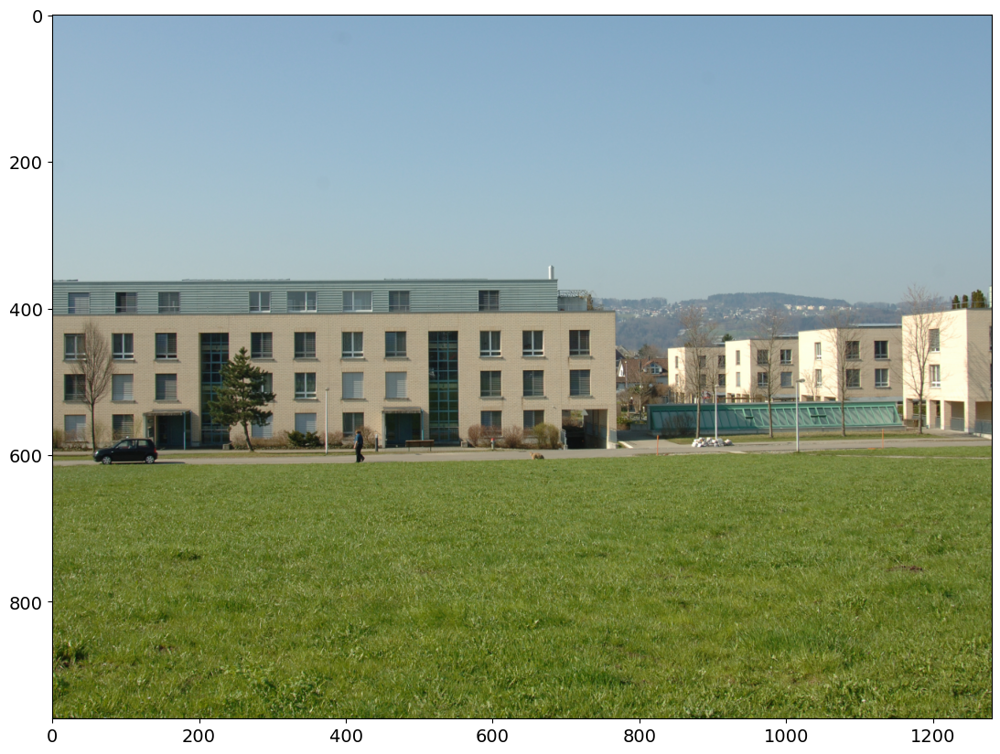

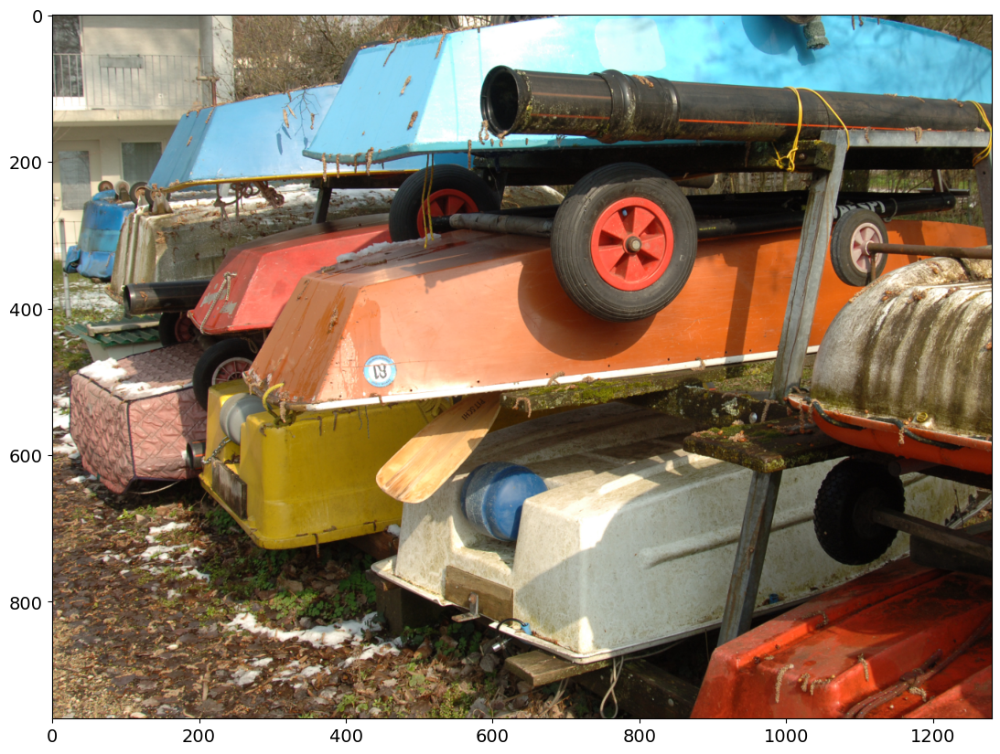

In [9]:
# Image ID 35 -- Horizontal
img = plt.imread("./dataset_download/8/35.png")
plt.imshow(img, zorder=0)
plt.show()

# Image ID 60 -- Vertical
img = plt.imread("./dataset_download/8/60.png")
plt.imshow(img, zorder=0)
plt.show()


### Q2B - Analysis

In [10]:
# Created shifted columns to allow for easy application of lambda below
saccades_df_35 = (data.loc[(data['category'] == 8.0) & (data['filenumber'] == 35.0)]).copy()
shifted_35 = ((saccades_df_35.shift(1)).loc[:,['x','y']]).rename(columns={'x':'x_1', 'y': 'y_1'})
saccades_df_35 = saccades_df_35.merge(shifted_35, on=shifted_35.index)

saccades_df_60 = (data.loc[(data['category'] == 8.0) & (data['filenumber'] == 60.0)]).copy()
shifted_60 = ((saccades_df_60.shift(1)).loc[:,['x','y']]).rename(columns={'x':'x_1', 'y': 'y_1'})
saccades_df_60 = saccades_df_60.merge(shifted_60, on=shifted_60.index)

In [11]:
# Custom formula to compare past value to current value and calculate the difference
def vertical_saccade(row):
    vertical = (abs(row['x'] - row['x_1'])) < (abs(row['y'] - (row['y_1'])))
    if vertical:
        return True
    else:
        return False

saccades_df_35['v_saccade'] = saccades_df_35.apply(vertical_saccade, axis=1)
saccades_df_60['v_saccade'] = saccades_df_60.apply(vertical_saccade, axis=1)    

In [12]:
img35_ratio = ((saccades_df_35['v_saccade'].value_counts())[True])/(saccades_df_35['v_saccade'].value_counts())[False]
img60_ratio = ((saccades_df_60['v_saccade'].value_counts())[True])/(saccades_df_60['v_saccade'].value_counts())[False]

print(f"The ratio of vertical to horizontal saccades for image 35 is {img35_ratio}. My hypothesis was correct")
print(f"The ratio of vertical to horizontal saccades for image 60 is {img60_ratio}. My hypothesis was wrong")


The ratio of vertical to horizontal saccades for image 35 is 0.23845007451564829. My hypothesis was correct
The ratio of vertical to horizontal saccades for image 60 is 0.6136363636363636. My hypothesis was wrong


The above made me curious about whether I was bad at choosing images or whether Foulsham was onto something, so I ran it on all the images from the set and found that none of the images broke 1 (i.e. had a higher # of vertical than horizontal saccades). 

Foulsham - 1; Vertical Saccades - 0 

;-)

In [13]:
image_indices = np.linspace(1.0,64.0,64)

def find_ratio(image_index):

    saccades_df_i = (data.loc[(data['category'] == 8.0) & (data['filenumber'] == image_index)]).copy()
    shifted_i = ((saccades_df_i.shift(1)).loc[:,['x','y']]).rename(columns={'x':'x_1', 'y': 'y_1'})
    saccades_df_i = saccades_df_i.merge(shifted_i, on=shifted_i.index)

    saccades_df_i['v_saccade'] = saccades_df_i.apply(vertical_saccade, axis=1)

    img_i_ratio = ((saccades_df_i['v_saccade'].value_counts())[True])/(saccades_df_i['v_saccade'].value_counts())[False]

    return print(img_i_ratio)

for i in image_indices:
    find_ratio(i)

0.7865612648221344
0.45884413309982486
0.6540642722117203
0.4768211920529801
0.8082474226804124
0.8128898128898129
0.594392523364486
0.7628865979381443
0.415748031496063
0.7544642857142857
0.5594405594405595
0.5515370705244123
0.5462962962962963
0.6641074856046065
0.2979310344827586
0.6020942408376964
0.48440065681444994
0.4153846153846154
0.4152139461172742
0.3997050147492625
0.4491803278688525
0.7937743190661478
0.41497659906396256
0.720616570327553
0.5391156462585034
0.7003676470588235
0.6942307692307692
0.7074074074074074
0.4166666666666667
0.5256410256410257
0.432
0.5594405594405595
0.6545454545454545
0.26453488372093026
0.23845007451564829
0.9318681318681319
0.6516245487364621
0.4391080617495712
0.4777397260273973
0.5034013605442177
0.37813884785819796
0.9508928571428571
0.7280334728033473
0.7746478873239436
0.7063197026022305
0.875
0.8078512396694215
0.36036036036036034
0.6458333333333334
0.625
0.3463855421686747
0.7835051546391752
0.5645756457564576
0.8158995815899581
0.9697624